# Pipeline for image size estimation

Imports

In [1]:
# basics
import numpy as np
import pandas as pd
import math
from tqdm import tqdm
# file work
import os
import json
# computer vision
import cv2
import torch
import laser_detection as ld
# models
from segment_anything import sam_model_registry, SamPredictor
from easy_ViTPose import VitInference
from huggingface_hub import hf_hub_download

/cluster/tufts/fuzzywuzzy/jbrand12/condaenv/fzwz/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Step 0: Assign input point to each image

run: 'python3 label.py' to get json of image names and input points (change path to folder in script)

## Step 1: Load image data from json

The below are modifiable variables you can change depending on what dataset you are running

In [2]:
# ALL DATA
# json_file = '../data/red_laser_data.json'  # must contain input labels
# image_folder = '../data/red_laser_data'
# mask_folder = '../data/red_laser_data_masks'  # can be empty to start

# SAMPLE DATA
json_file = 'sample_data/red_lasers/sample_data.json'  # must contain input labels
image_folder = 'sample_data/red_lasers/sample_data'
mask_folder = 'sample_data/red_lasers/sample_data_masks'  # can be empty to start

# load data
with open(json_file, 'r') as file:
    image_data = json.load(file)

In [3]:
len(image_data)

8

Some helper functions for displaying images

In [4]:
# function to show mask
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# function to show input point
def show_points(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='blue', marker='*', s=250, edgecolor='white', linewidth=1.25)

### let's visualize labels from json

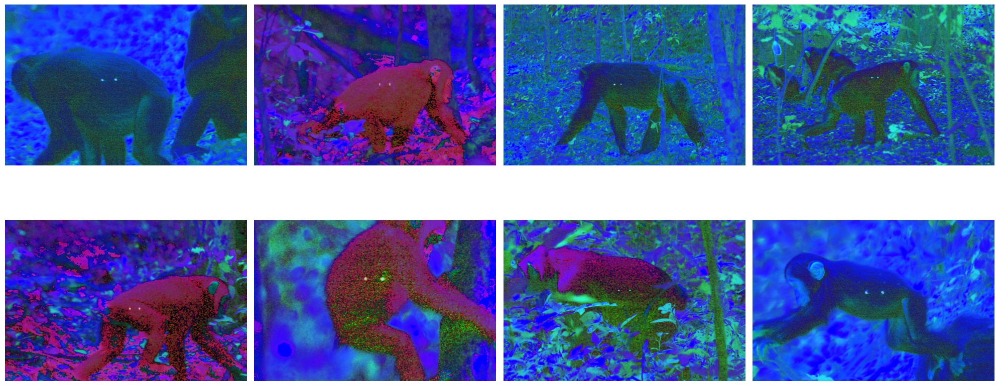

In [23]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
#         show_points(input_point, axs[idx])
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Looks good!

## Step 2: Run images through SAM to prep for laser detection

### ***only need to run this code once to get masks!!!

Set up SAM

In [6]:
# select checkpoint and model type
sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

# define predictor
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)

# change device if cuda is available
if torch.cuda.is_available():
    sam.to(device='cuda')

predictor = SamPredictor(sam)

In [65]:
def generate_mask(im, input_point):
    input_label = np.array([1])
    predictor.set_image(im)
    masks, scores, _ = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=True)
    # return best mask
    return masks[np.argmax(scores)]

Iterate through images and get mask

In [66]:
from tqdm import tqdm
# iterate through each entry in the JSON data
for image_name, im_data in tqdm(image_data.items(), desc="Processing Images"):
    image_path = os.path.join(image_folder, image_name)
    
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])
        # Generate the mask
        mask = generate_mask(img, input_point)
        mask = mask.astype(np.uint8)
        
        # Define the mask filename
        mask_filename = os.path.splitext(image_name)[0] + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_filename)
        
        # Save the mask
        cv2.imwrite(mask_path, mask)
        
        # Update the JSON data with the mask filename
        image_data[image_name]['mask'] = mask_filename

Processing Images: 100%|██████████| 8/8 [00:04<00:00,  1.65it/s]


viewing masks: 100%|██████████| 8/8 [00:05<00:00,  1.55it/s]


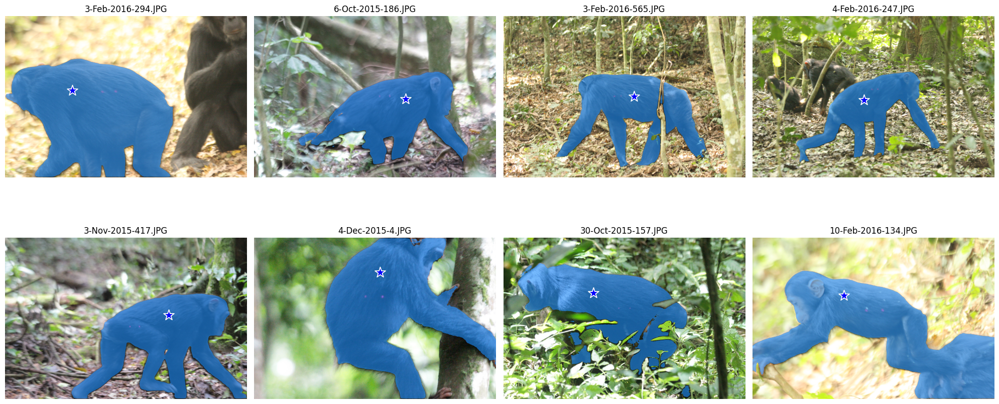

In [67]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in tqdm(image_data.items(), desc="viewing masks"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = im_data['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        show_mask(mask, axs[idx])
        axs[idx].axis('off')
        axs[idx].set_title(image_name)

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Good stuff

## Step 3: laser point detection

In [35]:
def draw_dots(points, ax, color):
    ax.scatter(points[:, 0], points[:, 1], color=color, s=10)

In [56]:
import cProfile
import pstats

In [79]:
import importlib
importlib.reload(ld)

# profile = cProfile.Profile()
# profile.enable()

# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="detecting lasers"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    source = cv2.imread(image_path)

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    mask = mask > 0  # need to convert to boolean values

    if source is not None:
        # adjust accodringly
        points = ld.detect_red_laser_points(source, mask)
        # points = ld.detect_green_laser_points(source, mask)
        
        # Update the JSON data with the mask filename
        image_data[image_name]['laser_points'] = points
        
# profile.disable()
# ps = pstats.Stats(profile).sort_stats('cumulative')
# ps.print_stats()

detecting lasers: 100%|██████████| 8/8 [00:59<00:00,  7.46s/it]


let's checkout the results

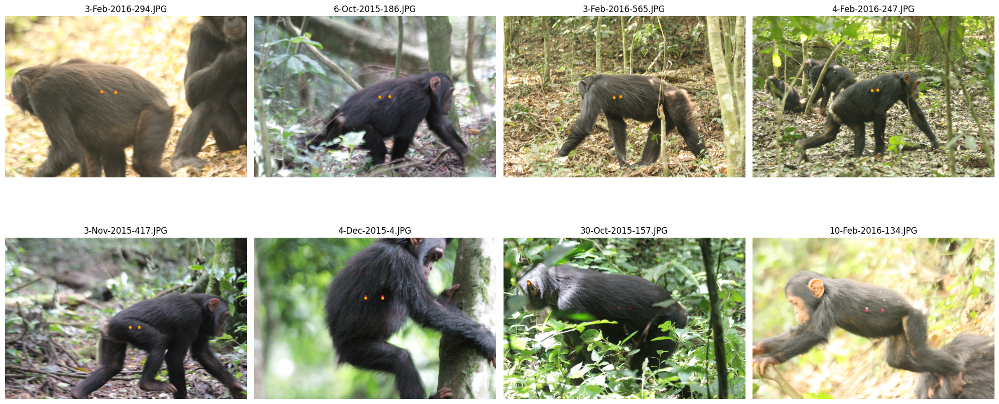

In [80]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        # extract coordinates
        points = np.array(info['laser_points'])

        # plot image
        axs[idx].imshow(img)
        if len(points == 2):
            draw_dots(points, axs[idx], "orange")
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} - {len(points)} point/s detected")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 4: Run VitPose

In [17]:
# define model parameters
MODEL_SIZE = 'b'
YOLO_SIZE = 'n'
DATASET = 'apt36k'
ext = '.pth'
ext_yolo = '.pt'

# download model_path and yolo_path
MODEL_TYPE = "torch"
YOLO_TYPE = "torch"
REPO_ID = 'JunkyByte/easy_ViTPose'
FILENAME = os.path.join(MODEL_TYPE, 
                        f'{DATASET}/vitpose-' + MODEL_SIZE + f'-{DATASET}') + ext
FILENAME_YOLO = 'yolov8/yolov8' + YOLO_SIZE + ext_yolo
print(f'Downloading model {REPO_ID}/{FILENAME}')
model_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME)
yolo_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME_YOLO)

In [18]:
# initialize model
model = VitInference(model_path, yolo_path, MODEL_SIZE, dataset=DATASET)

In [19]:
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="ViTPose"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # get keypoints
    img_arr = np.array(img, dtype=np.uint8)
    keypoints = model.inference(img_arr)

    if keypoints:
        # store results
        shoulder = (keypoints[0][3][1], keypoints[0][3][0])
        rump = (keypoints[0][4][1], keypoints[0][4][0])
      
        # Update the JSON data with shoulder and rump
        image_data[image_name]['shoulder_rump'] = [shoulder, rump]
    else:
        print(f"vitpose failed for {image_path}")
        # TODO how do we want to handle this case in the json?
        image_data[image_name]['shoulder_rump'] = None

ViTPose:  12%|█▎        | 1/8 [00:00<00:04,  1.51it/s]

vitpose failed for sample_data/green_lasers/sample_data/IMG_0615.JPG


ViTPose: 100%|██████████| 8/8 [00:02<00:00,  3.55it/s]


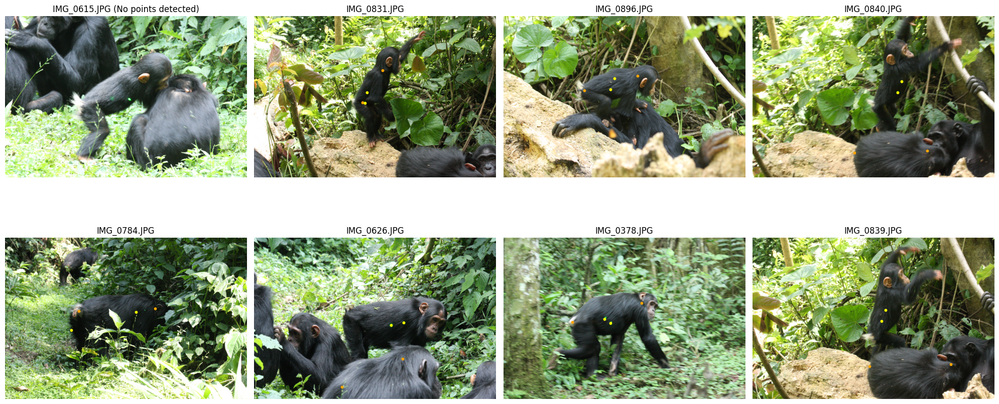

In [20]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        body_points = info['shoulder_rump']
        laser_points = info['laser_points']

        # plot image
        axs[idx].imshow(img)
        if body_points:
            draw_dots(np.array(body_points), axs[idx], 'orange')
            draw_dots(np.array(laser_points), axs[idx], 'yellow')
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} (No points detected)")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 5: get distances

In [21]:
measured_df = pd.read_csv('../data/measured.csv')
measured_df = measured_df.dropna(subset=['PhotoID'])

Get dictionaries for conversions

In [22]:
laser_width = dict(zip(measured_df['PhotoID'], measured_df['Laser Width']))
body_length = dict(zip(measured_df['PhotoID'], measured_df['BodyLength1']))
pix_laser = dict(zip(measured_df['PhotoID'], measured_df['PixLaser1']))
pix_length = dict(zip(measured_df['PhotoID'], measured_df['PixLength1']))

In [23]:
# iterate through each entry in json
for image_name, info in image_data.items():
    try:
        # truth distances in pixels
        laser_points = info['laser_points']
        body_points = info['shoulder_rump']

        laser_dist = round(math.dist(laser_points[0], laser_points[1]), 1)
        body_dist = round(math.dist(body_points[0], body_points[1]), 1)

        # spreadsheet distances
        ss_laser_dist = pix_laser[image_name.split('.')[0]]
        ss_body_dist = pix_length[image_name.split('.')[0]]
        print(f"Our laser: {laser_dist}\t Our body: {body_dist}")
        print(f"Csv laser: {ss_laser_dist}\t Csv body: {ss_body_dist}\n")
    except:
        pass

Our laser: 195.1	 Our body: 884.9
Csv laser: nan	 Csv body: nan

Our laser: 191.5	 Our body: 1172.2
Csv laser: nan	 Csv body: nan

Our laser: 1080.6	 Our body: 1231.8
Csv laser: nan	 Csv body: nan

Our laser: 207.9	 Our body: 1076.0
Csv laser: nan	 Csv body: nan

Our laser: 120.4	 Our body: 1160.2
Csv laser: nan	 Csv body: nan



In [24]:
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="Calculating Final Distances"):
    try:
        # distances in pixels
        laser_points = info['laser_points']
        body_points = info['shoulder_rump']

        # calculate ratio
        laser_dist = round(math.dist(laser_points[0], laser_points[1]), 1)
        body_dist = round(math.dist(body_points[0], body_points[1]), 1)
        ratio = laser_dist / body_dist

        # lookup laser width
        photo_id = image_name.split('.')[0]
        laser_in = laser_width[photo_id]
        # compare results
        predicted_length = laser_in / ratio
        true_length = body_length[photo_id]
        error = round(abs(predicted_length - true_length) / true_length, 3)
        print(f"Predicted: {predicted_length}\t Actual: {true_length}\t Error = {error}")
    except:
        pass

Calculating Final Distances: 100%|██████████| 8/8 [00:00<00:00, 51622.20it/s]

Predicted: 24.708258534085086	 Actual: 26.63885622	 Error = 0.072
Predicted: 33.51635039164491	 Actual: 24.68460208	 Error = 0.358
Predicted: 6.496758967240422	 Actual: 52.29542783	 Error = 0.876
Predicted: 30.259976911976914	 Actual: 23.68127226	 Error = 0.278
Predicted: 52.03554817275747	 Actual: 55.32983478	 Error = 0.06
